<a href="https://colab.research.google.com/github/yiyunwu2001/OPTI556_Resources/blob/main/Wu_YiYun_OPTI556_HW2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OPTI 556 Computational Imaging
### Homework 2: Recreate figures from Chapter 3 - Image Estimation
### YiYun Wu
### 19 September 2023

# Setup Code

In [2]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display, clear_output
import ipywidgets as widgets
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import interpolate as interp
from scipy.special import expit
from scipy.interpolate import interp1d, InterpolatedUnivariateSpline
import scipy.integrate as integrate
from scipy.signal import convolve2d, convolve
from scipy.signal import bspline
import pywt
from google.colab import files
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Model
from tensorflow.keras.activations import gelu, elu, sigmoid, swish, relu
from skimage import io
from skimage import color, data, restoration, exposure
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import imageio
from PIL import Image
import cv2
from scipy.linalg import toeplitz
%matplotlib inline
from sklearn import linear_model
from skimage import filters
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams.update({'font.size': 22})

In [ ]:
!wget https://download.chiantidatabase.org/CHIANTI_10.0.1_database.tar.gz
!mkdir dbase
!tar xvf CHIANTI_10.0.1_database.tar.gz -C dbase/
!pip3 install ChiantiPy
!pip3 install ipyparallel
%env XUVTOP=/content/dbase/
import ChiantiPy.core as ch

--2023-09-11 02:26:53--  https://download.chiantidatabase.org/CHIANTI_10.0.1_database.tar.gz
Resolving download.chiantidatabase.org (download.chiantidatabase.org)... 70.32.23.63
Connecting to download.chiantidatabase.org (download.chiantidatabase.org)|70.32.23.63|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 888202017 (847M) [application/x-gzip]
Saving to: ‘CHIANTI_10.0.1_database.tar.gz’

CHIANTI_10.0.1_data 100%[===================>] 847.05M  53.1MB/s    in 16s     

2023-09-11 02:27:10 (52.6 MB/s) - ‘CHIANTI_10.0.1_database.tar.gz’ saved [888202017/888202017]

README_CHIANTI
VERSION
abundance/
abundance/sun_coronal_2012_schmelz_ext.abund
abundance/cosmic_1973_allen.abund
abundance/sun_photospheric_2011_caffau.abund
abundance/sun_photospheric_2015_scott.abund
abundance/unity.abund
abundance/sun_coronal_1999_fludra_ext.abund
abundance/sun_photospheric_1998_grevesse.abund
abundance/sun_coronal_1992_feldman_ext.abund
abundance/sun_coronal_1999_fludra.abund
ab

# Wiener Filtering in 1D

Let's define the impulse response $h(x) = rect(\frac{x}{\Delta})$, which translates to a sinc blur in the frequency domain.

In [ ]:
def h(x,delta):
  h=bspline(x/delta,0)
  return h
def hhat(u,delta):
  h=delta*np.sinc(delta*u)
  return h
def w(u,delta, snr):
  w=np.conjugate(hhat(u,delta))*snr/((np.abs(hhat(u,delta))**2)*snr+1)
  return w

Given our sample atomic spectrum:

Text(0, 0.5, 'erg cm$^{-2}$ s$^{-1}$ sr$^{-1}$Å$^{-1}$($\\int\\,$ N$_e\\,$N$_H\\,$d${\\it l}$)$^{-1}$')

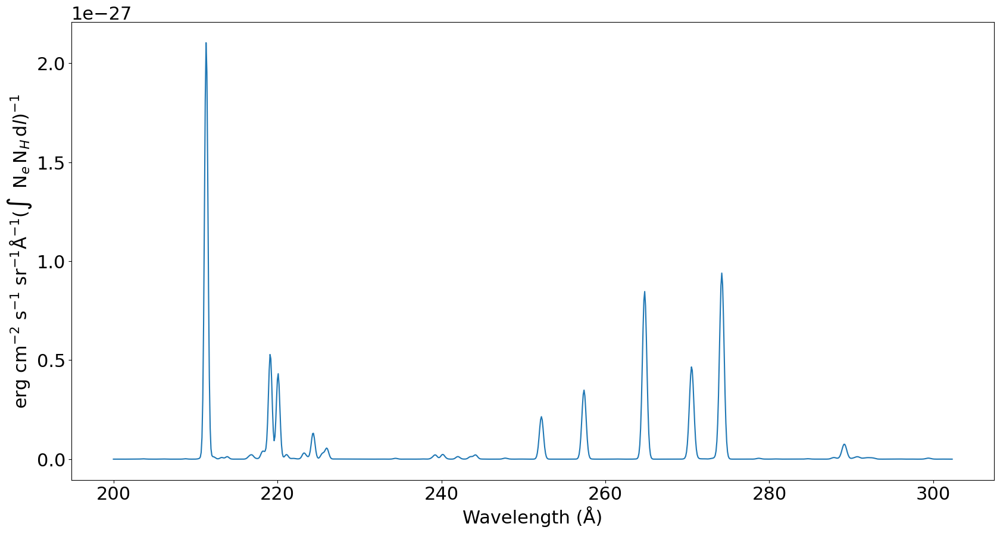

In [ ]:
t = 10.**(5.8 + 0.05*np.arange(21.))
fe14 = ch.ion('fe_14', temperature=t, eDensity=1.e+9)
wvl = wvl=200. + 0.1*np.arange(1024)
fe14.spectrum(wvl)
plt.plot(wvl,fe14.Spectrum['intensity'][5,:])
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])

Measurement with impulse function defined above would blur the peaks:

Text(0, 0.5, 'erg cm$^{-2}$ s$^{-1}$ sr$^{-1}$Å$^{-1}$($\\int\\,$ N$_e\\,$N$_H\\,$d${\\it l}$)$^{-1}$')

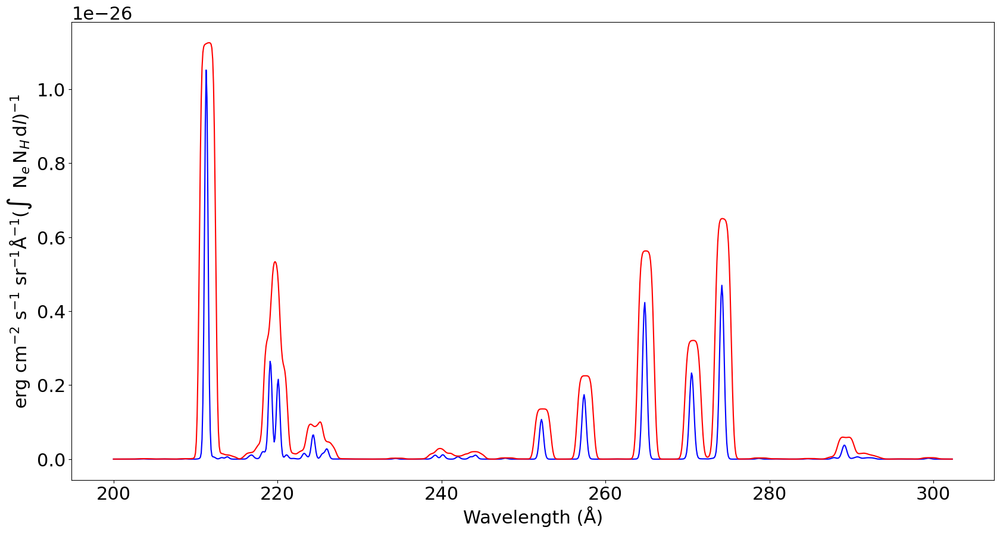

In [ ]:
xrange=np.arange(-5,5,.1)
delta=2
g=convolve(fe14.Spectrum['intensity'][5,:],h(xrange,delta),'same')
plt.plot(wvl,5*fe14.Spectrum['intensity'][5,:],'b',wvl,g,'r')
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])

*Figure 3.1: Atomic spectrum of $Fe_{14}$ as blurred by a 2 $Å$ rectangular impulse response.*

To fix this, we can use a Wiener filter, which is essentially an algorithm that estimates the object $\hat{f}$ by applying a filter $\hat{w}$ to the measured signal $\hat{g}$:
$$\hat{f}_{est}=\hat{w}(u)\hat{g}(u)$$ such that the mean squared error $\epsilon$ is minimized at each frequency $u$.
$$\epsilon(u) = ⟨(\hat{f}-\hat{f}_{est})^2⟩ $$

Text(0.5, 1.0, 'SNR =1000')

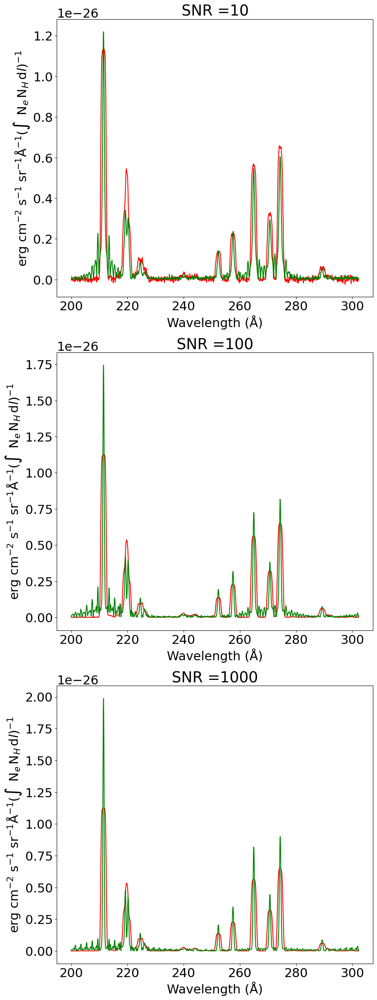

In [ ]:
plt.rcParams['figure.figsize'] = [10, 30]
urange=np.arange(-1/(2*(xrange[1]-xrange[0])),1/(2*(xrange[1]-xrange[0])),1/(1024*(xrange[1]-xrange[0])))
snr=10
g10=g+np.random.normal(0,.1*np.mean(g),1024)
fest10=np.fft.ifft(w(urange,delta,snr)*np.fft.fftshift(np.fft.fft(g10)))
snr=100
g100=g+np.random.normal(0,.01*np.mean(g),1024)
fest100=np.fft.ifft(w(urange,delta,snr)*np.fft.fftshift(np.fft.fft(g100)))
snr=1000
g1000=g+np.random.normal(0,.001*np.mean(g),1024)
fest1000=np.fft.ifft(w(urange,delta,snr)*np.fft.fftshift(np.fft.fft(g1000)))
plt.subplot(3,1,1)
plt.plot(wvl,g10,'r',wvl,np.abs(fest10),'g')
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('SNR =10')
plt.subplot(3,1,2)
plt.plot(wvl,g100,'r',wvl,np.abs(fest100),'g')
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('SNR =100')
plt.subplot(3,1,3)
plt.plot(wvl,g1000,'r',wvl,np.abs(fest1000),'g')
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('SNR =1000')

*Figure 3.2: Signal of Fig. 3.1 shown with both the measured data with additive Gaussian noise and the spectrum recontructed with the Wiener filter for various noise levels. Red - measured signal, Green - reconstruction.*

From figure 3.2, you see that the Wiener filter is able to successfully reconstruct the spectrum, even with low SNR.

# Wiener Filtering of 2D Images

--2023-09-10 23:43:19--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy [following]
--2023-09-10 23:43:19--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8.0M) [application/octet-stream]
Saving to: ‘snake.npy’

snake.npy           100%[===================>]   8.00M  --.-KB/s    in 0.05s   

2023-09-1

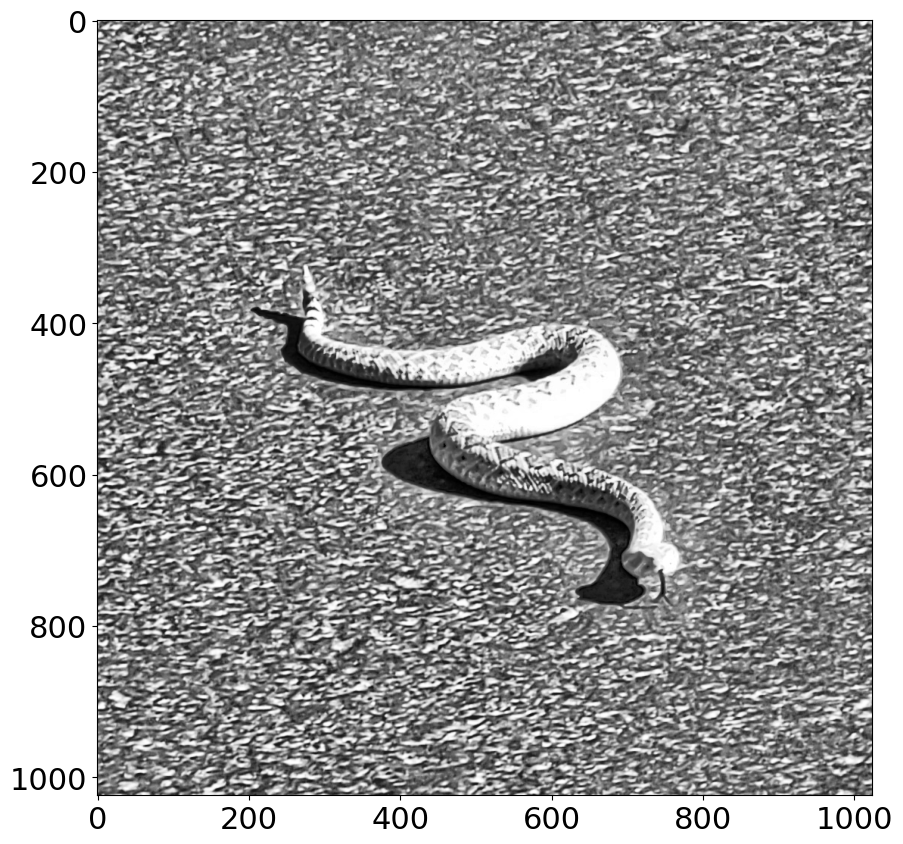

In [ ]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy'
snake=np.load('snake.npy')
snake=exposure.equalize_adapthist(snake)
plt.imshow(snake,cmap='gray')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

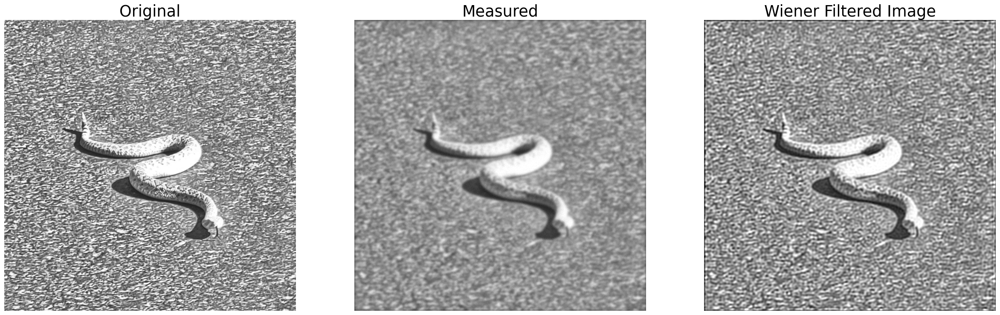

In [ ]:
# convolve with sampling psf
snr=10
xrange=np.linspace(-3,3,32)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
snaked = convolve2d(snake, psf, 'same')
#add noise
snaked += snake.std() * np.random.standard_normal(snake.shape)/snr

deconvolved = restoration.wiener(snaked, psf,1/snr)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(snake, vmin=deconvolved.min(), vmax=deconvolved.max())
ax[0].axis('off')
ax[0].set_title('Original')
ax[1].imshow(snaked, vmin=deconvolved.min(), vmax=deconvolved.max())
ax[1].axis('off')
ax[1].set_title('Measured')
ax[2].imshow(deconvolved)
ax[2].axis('off')
ax[2].set_title('Wiener Filtered Image')

*Figure 3.3: 1024 x 1024 pixel image blurred by a 10 pixel standard deviation Gaussian filter with SNR = 10 additive Gaussian noise estimated using the Wiener filter. This demonstrates reconstruction using the Wiener filter in 2D*

# Linear Regression: OLS, Tikhonov, tSVD, LASSO, TV

<ipython-input-11-f49dd0c58cee>:13: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  fe=np.linalg.lstsq(H,meas)[0]


Text(0.5, 1.0, 'Tikhonov')

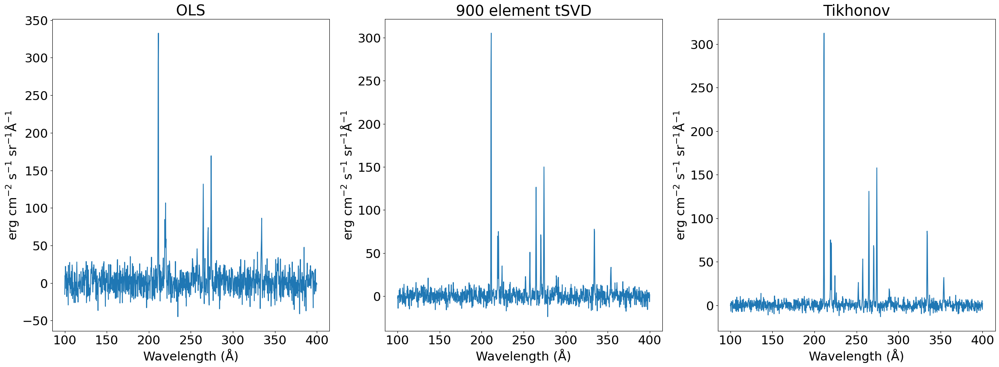

In [ ]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,fe14.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.subplot(1,3,1)
fe=np.linalg.lstsq(H,meas)[0]
plt.plot(wvl,fe)
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(1,3,2)
reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.plot(wvl,fe)
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('900 element tSVD')
plt.subplot(1,3,3)
lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.plot(wvl,fe)
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('Tikhonov')

*Figure 3.4: Atomic spectrum of Fig. 3.1 measured with bipolar real values $H$. Gaussian random noise is added to the measurement and the signal is estimated using OLS, tSVD and Tikhonov regularization.*

From Figure 3.4 above, we see that the most successful reconstruction was using Tikhonov regularization. The OLS (ordinary least squares) estimator shows poor performance. Looking at the *Moore-Penrose pseudoinverse* of $H$, we can see a $n/\lambda_i$ term, which means the OLS estimator amplifies the noise associated with the weakest singular values $\lambda_i$. tSVD (truncated SVD reconstruction) shows better performance than OLS, but as a biased estimator, it will still leave high frequency artifacts of the measured signal in the estimated signal. Tikhonov is basically a generalization of the Wiener filter for shift variant measurements, and it works by constraining the norm of the estimated signal. With Tikhonov, you can see a clear damping of the high frequency noise fluctuations.

<ipython-input-10-87ee045389e5>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,3,1)


Text(0.5, 1.0, 'LASSO Estimate')

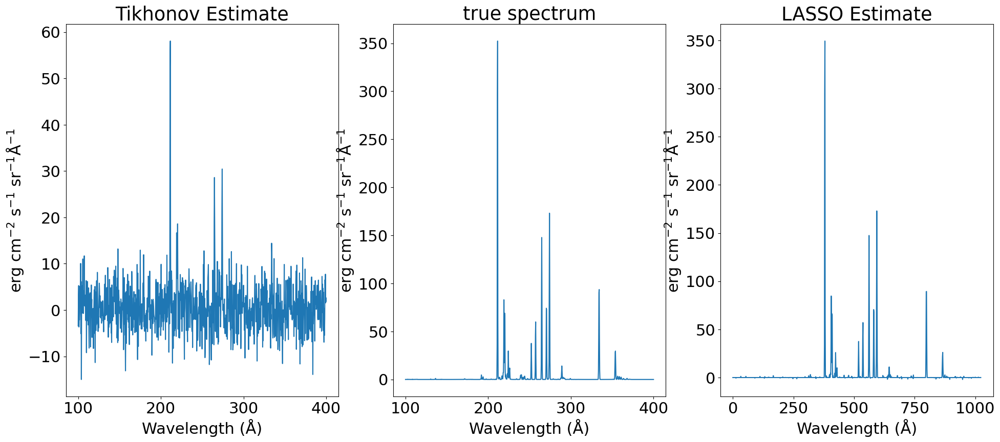

In [ ]:
t=2000000
fe14 = ch.ion('fe_14', temperature=t, eDensity=1.e+9, em=1.e+27)
fe14.intensityPlot(wvlRange=[210.,400.],linLog='log')
wvl = np.linspace(100,400,1024)
fe14.spectrum(wvl)
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=400
noiseLevel=3
H=np.random.random((R,1024))-.5
y=np.matmul(H,fe14.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
plt.subplot(1,3,1)
#fe=np.linalg.lstsq(H, y)[0]
lpam=10
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), y)
plt.plot(wvl,fe)
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('Tikhonov Estimate')
plt.subplot(1,3,2)
plt.plot(wvl,fe14.Spectrum['intensity'])
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('true spectrum')
model = linear_model.Lasso(alpha=0.1)
model.fit(H,y)
fe=model.coef_
plt.subplot(1,3,3)
plt.plot(fe)
plt.xlabel(fe14.Spectrum['xlabel'])
plt.ylabel(fe14.Spectrum['ylabel'])
plt.title('LASSO Estimate')

*Figure 3.5: Estimation of the spectrum of Fig. 3.1 for $H$ a 400 x 1024 matrix. Gaussian random noise is added to the measurement and the signal is estimated using Tikhonov and LASSO regression.*

Figure 3.5 shows we can eliminate noise with LASSO regression (least absolute shrinkage and selection operator), which basically works by shrinking data points towards the mean. Both Tikhonov and LASSO augment measurements with an objective function, but the objective function $ \\gamma(f_e)$ is chosen to be the Euclidean norm of the linear estimate for Tikhonov and the Taxicab norm of the linear estimate for LASSO.  
Tikhonov: $$\gamma(f_e) = ||f_e||_2$$
LASSO: $$\gamma(f_e) = ||f_e||_1$$

--2023-09-11 02:36:59--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy [following]
--2023-09-11 02:37:00--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/snake.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8.0M) [application/octet-stream]
Saving to: ‘snake.npy’

snake.npy           100%[===================>]   8.00M  --.-KB/s    in 0.07s   

2023-

Text(0.5, 1.0, 'TV Restored')

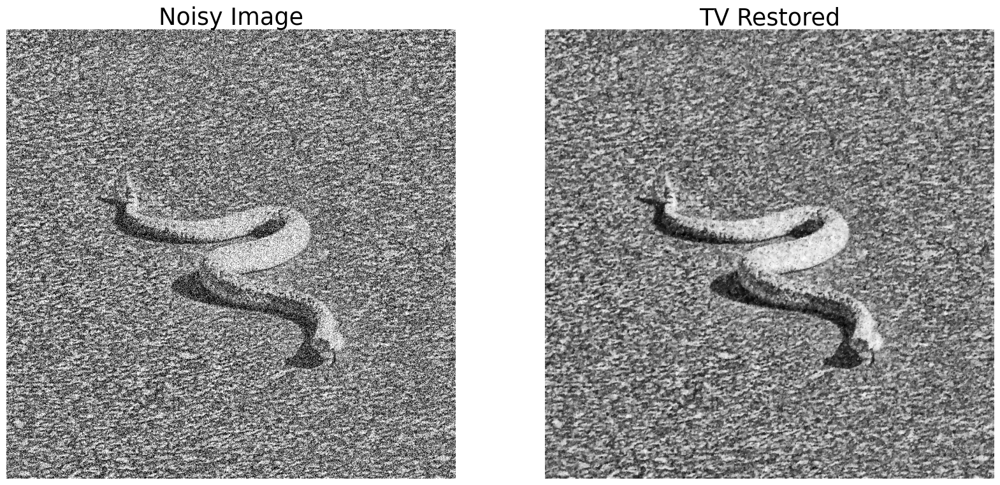

In [ ]:
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/snake.npy'
from skimage.restoration import denoise_tv_chambolle
from skimage import color, data, restoration, exposure, filters
from skimage.util import random_noise
snake=np.load('snake.npy')
snake=exposure.equalize_adapthist(snake)

sigma = .5
snake = random_noise(snake, var=sigma**2)
denoised = denoise_tv_chambolle(snake, weight=0.2)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(snake)
ax[0].axis('off')
ax[0].set_title('Noisy Image')
ax[1].imshow(denoised)
ax[1].axis('off')
ax[1].set_title('TV Restored')

*Figure 3.6: Total variation denoising. The image is corrupted with additive Gaussian noise.*

With TV (total variation) denoising, the objective function is chosen to be the taxicab norm of the laplacian of the linear estimate.$$\gamma(f_e) = ||\nabla f_e||_1$$

Text(0.5, 1.0, 'TV Detail')

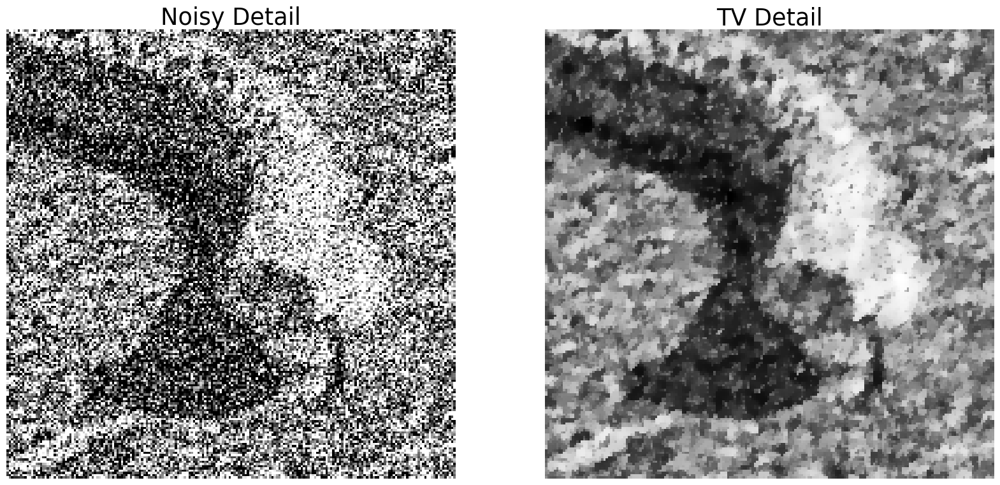

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(snake[600:800,600:800])
ax[0].axis('off')
ax[0].set_title('Noisy Detail')
ax[1].imshow(denoised[600:800,600:800])
ax[1].axis('off')
ax[1].set_title('TV Detail')

*Figure 3.7: Detail of Fig. 3.6. Note the tendency of TV regression to over-smooth data.*

<ipython-input-15-b4597e22e2ae>:12: FutureWarning: `iterations` is a deprecated argument name for `richardson_lucy`. It will be removed in version 1.0. Please use `num_iter` instead.
  deconvolvedRL=restoration.richardson_lucy(snaked, psf, iterations=100)


Text(0.5, 1.0, 'EM Deconvolved Image')

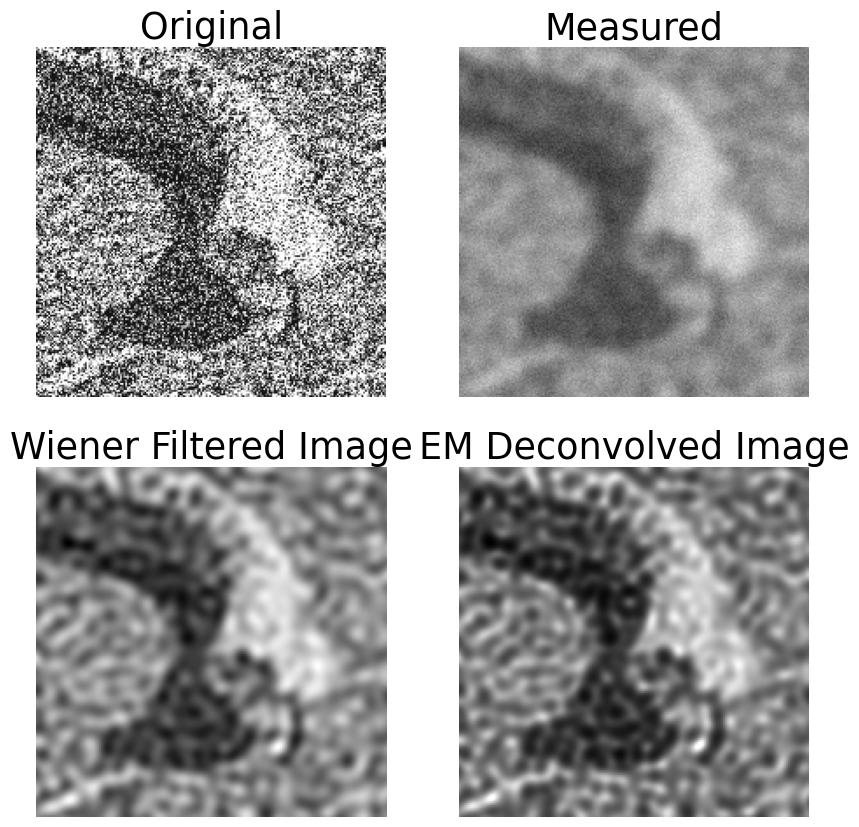

In [ ]:
# convolve with sampling psf
snr=10
xrange=np.linspace(-3,3,32)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
snaked = convolve2d(snake, psf, 'same')
#add noise
snaked += snake.std() * np.random.standard_normal(snake.shape)/snr

deconvolved = restoration.wiener(snaked, psf,1/snr)
deconvolvedRL=restoration.richardson_lucy(snaked, psf, iterations=100)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0,0].imshow(snake[600:800,600:800], vmin=deconvolved.min(), vmax=deconvolved.max())
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(snaked[600:800,600:800], vmin=deconvolved.min(), vmax=deconvolved.max())
ax[0,1].axis('off')
ax[0,1].set_title('Measured')
ax[1,0].imshow(deconvolved[600:800,600:800])
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image')
ax[1,1].imshow(deconvolvedRL[600:800,600:800])
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image')

*Figure 3.8: Detail of the image and sampling psf of Fig. 3.3 comparing deconvolution with the Weiner filter and expectation maximization.*

# Neural Estimators

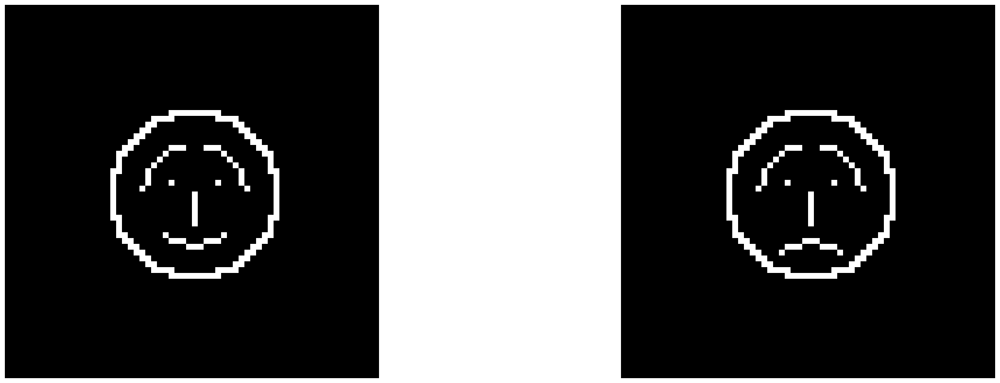

In [ ]:
# target images
face=np.zeros((64,64))
for i in range(1,64):
    for j in range(1,64):
        if np.abs((i-64/2)**2+(j-64/2)**2-200)<20:
            face[i,j]=1;
        elif np.abs((i-64/2)**2+(j-64/2)**2-75)<10 & i<25:
            face[i,j]=1;
face[30,28]=1;
face[30,36]=1;
face[32:38,32]=1;
smile=face[38:44,26:40]
frown=np.flip(smile,axis=0)
sadFace=np.zeros(np.shape(face))
sadFace=sadFace+face;
sadFace[38:44,26:40]=frown;
ig, ax = plt.subplots(nrows=1, ncols=2)
for a in (ax[0], ax[1]):
       a.axis('off')

ax[0].imshow(face)

ax[1].imshow(sadFace)

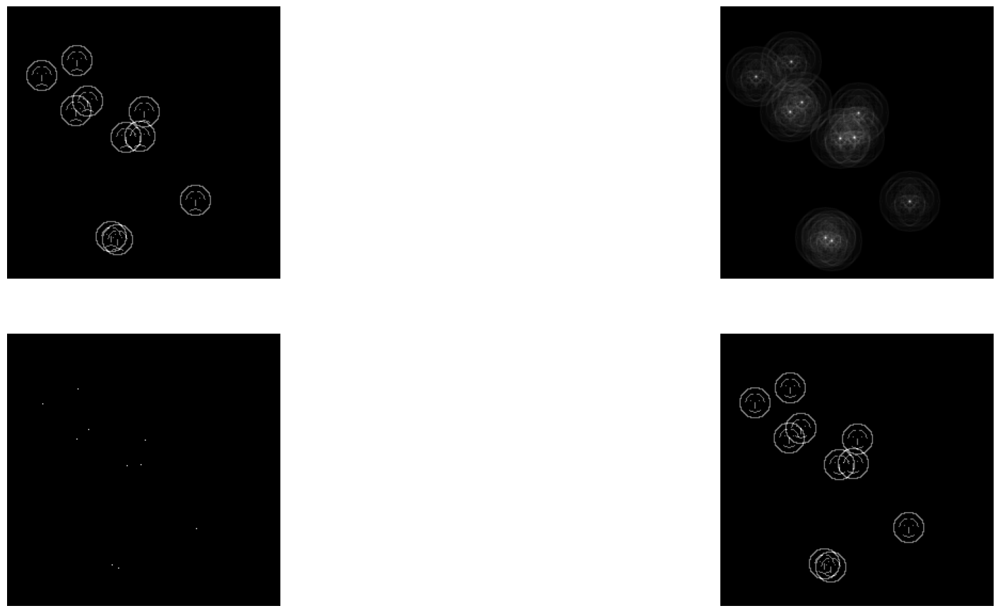

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2)
plt.rcParams['figure.figsize'] = [10, 10]
plt.gray()

for a in (ax[0,0], ax[0,1], ax[1,0], ax[1,1]):
       a.axis('off')



#
# now we add  faces to the image
#
#
x=np.random.choice(range(32,222),size=10,replace=False)
y=np.random.choice(range(32,222),size=10,replace=False)
sImage=np.zeros((256,256))
for pip in range(10):
  sImage[(x[pip]-32):(x[pip]+32),(y[pip]-32):(y[pip]+32)]=sImage[(x[pip]-32):(x[pip]+32),(y[pip]-32):(y[pip]+32)]+0.25*sadFace
ax[0,0].imshow(sImage,cmap='gray')
#
# we use matched filtering to find the faces.
#
match=convolve2d(sImage,sadFace, mode='same')
ax[0,1].imshow(match,cmap='gray')
#
# now we use an activation function to find the matches
#
featureMap=expit(10*(match-.8*np.max(match)))
ax[1,0].imshow(featureMap,cmap='gray')
#
# now replace the frowns with smiles
#
substitution=sImage+.25*convolve2d(np.roll(featureMap,(-2,-2),axis=(0,1)),face-sadFace,mode='same')
ax[1,1].imshow(substitution,cmap='gray')
fig.subplots_adjust(wspace=0.02, hspace=0.2,
                    top=0.9, bottom=0.05, left=0, right=1)

*Figure 3.9: The image at upper left consists of 10 randomly placed cartoon frowns. The image at upper right is the convolution at the locations of the faces. The feature map lower left attempts to find the locations of the faces by operating on the convolution with a sigmoid activation function. The image at lower right is formed by adding the convolution of a smiley face with the feature map and subtracting a similar convolution of the frown.*

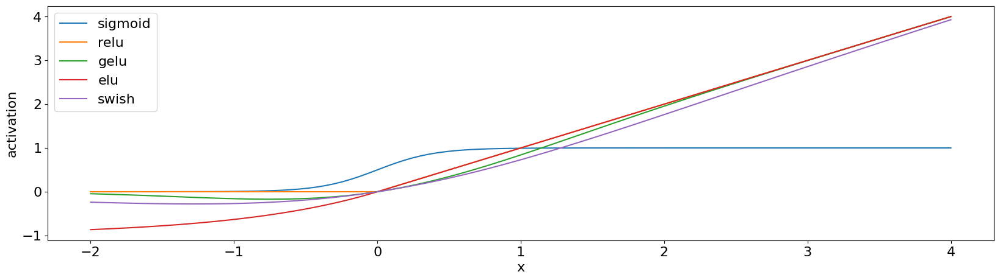

In [ ]:
#
# relu, sigmoid and softmax optimization functions
#
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams.update({'font.size': 16})
x=np.linspace(-2,4,100)
plt.plot(x,sigmoid(5*x),label='sigmoid')
plt.plot(x,relu(x),label='relu')
plt.plot(x,gelu(x),label='gelu')
plt.plot(x,elu(x),label='elu')
plt.plot(x,swish(x),label='swish')
plt.xlabel('x')
plt.ylabel('activation')
plt.legend()
plt.savefig('activation.pdf')
#files.download('activation.pdf')

*Figure 3.10: Common activation functions.*

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 15.0 MB/s eta 0:00:00
--2023-09-11 02:57:14--  https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/rawColor.dng
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/rawColor.dng [following]
--2023-09-11 02:57:14--  https://raw.githubusercontent.com/djbradyAtOpticalSciencesArizona/computationalImaging/master/images/rawColor.dng
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response..

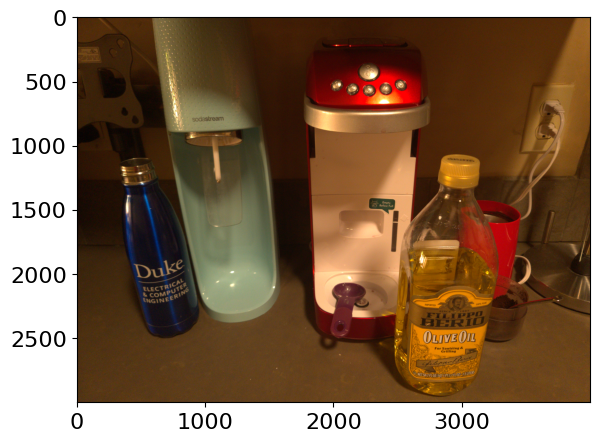

In [ ]:
!pip install visualkeras
import visualkeras
!pip install rawpy
import rawpy
!wget --no-check-certificate --content-disposition 'https://github.com/djbradyAtOpticalSciencesArizona/computationalImaging/raw/master/images/rawColor.dng'
raw = rawpy.imread('rawColor.dng')
rawImage=raw.raw_image_visible
plt.imshow(raw.postprocess())

*Figure 3.11: An example RGB image.*

(-0.5, 99.5, 99.5, -0.5)

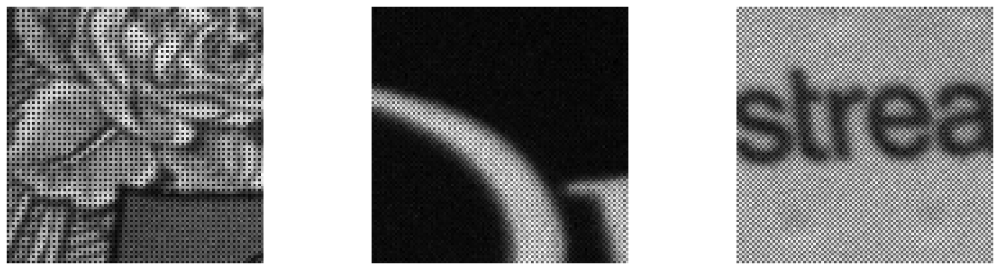

In [ ]:
plt.gray()
plt.rcParams['figure.figsize'] = [20, 10]
plt.subplot(1,3,1)
plt.imshow(rawImage[2600:2700,2600:2700])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(rawImage[1900:2000,500:600])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(rawImage[750:850,1000:1100])
plt.axis('off')

*Figure 3.12: Detail of the raw pixel data from Fig. 3.11. Notice the difference in patterns between the predominantly yellow area on the left, the blue area in the center and the light blue region on the right.*

## Training Materials for Neural Estimator

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
from google.colab import files
uploaded = files.upload()

Saving kodim01.png to kodim01.png
Saving kodim02.png to kodim02.png
Saving kodim03.png to kodim03.png
Saving kodim04.png to kodim04.png
Saving kodim05.png to kodim05.png
Saving kodim06.png to kodim06.png
Saving kodim07.png to kodim07.png
Saving kodim08.png to kodim08.png
Saving kodim09.png to kodim09.png
Saving kodim10.png to kodim10.png
Saving kodim11.png to kodim11.png
Saving kodim12.png to kodim12.png
Saving kodim13.png to kodim13.png
Saving kodim14.png to kodim14.png
Saving kodim15.png to kodim15.png
Saving kodim16.png to kodim16.png
Saving kodim17.png to kodim17.png
Saving kodim18.png to kodim18.png
Saving kodim19.png to kodim19.png
Saving kodim20.png to kodim20.png
Saving kodim21.png to kodim21.png
Saving kodim22.png to kodim22.png
Saving kodim23.png to kodim23.png
Saving kodim24.png to kodim24.png


Training images have been uploaded.

1/1 [==============================] - 0s 273ms/step


(-0.5, 767.5, 511.5, -0.5)

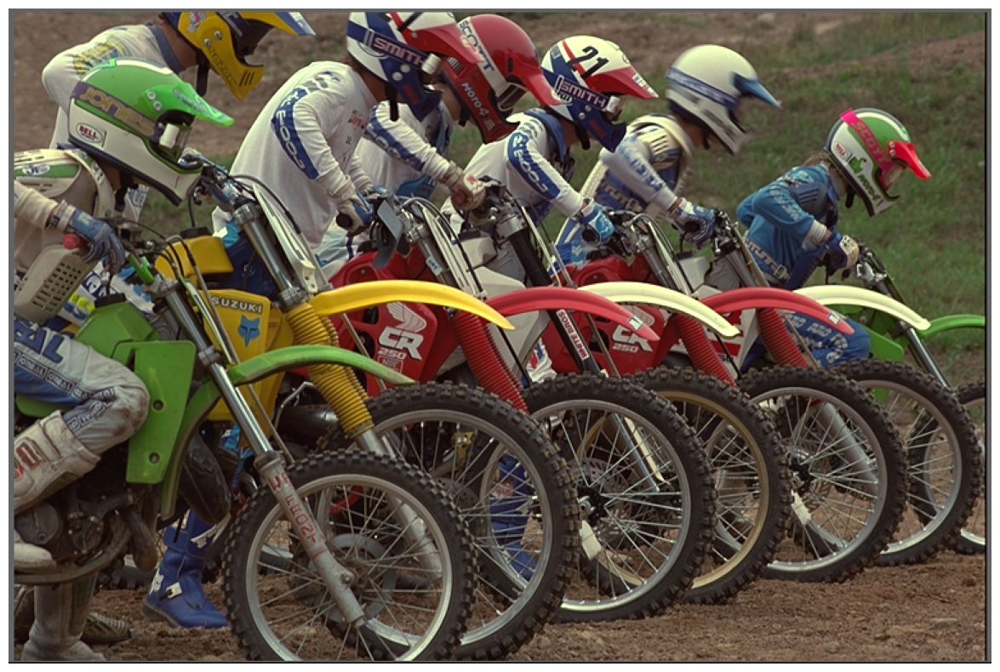

In [10]:
im=np.zeros((24,512,768,3))
for pop in range(1,10):
  fileN="kodim0"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h,c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.
for pop in range(10,25):
  fileN="kodim"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h, c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.

#This is the filter array for Bayer color sampling
def bayerCFA(shape,dtype='none'):
    kernel = np.array([[[1,0,0],[0,0,0]],[[0,0,0],[0,0,0]]])
    kernel = np.stack((kernel,np.array([[[0,0,0],[0,1,0]],[[0,0,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,1,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,0,0],[0,0,1]]] )),axis=-1)
    return kernel

# This network transforms a 32 by 32 color image into a 16 by 16 by 4 bayer sample array
inputs = layers.Input(shape=(None,None,3))
cfa = layers.Conv2D(4, (2,2), (2,2), use_bias=False, input_shape=(32,32,3),kernel_initializer=bayerCFA, trainable=False)(inputs)
cfaSample=Model(inputs,cfa)

def rgb2bayerGR2(image):
  w,h, c=image.shape
  bayer=np.zeros((w,h))
  bayer[0:w:2,0:h:2]=image[0:w:2,0:h:2,1]
  bayer[1:w:2,1:h:2]=image[1:w:2,1:h:2,1]
  bayer[0:w:2,1:h:2]=image[0:w:2,1:h:2,0]
  bayer[1:w:2,0:h:2]=image[1:w:2,0:h:2,2]
  bayer=255*bayer/np.max(bayer)
  bayer=bayer.astype('uint8')
  return bayer

dog=cfaSample.predict(im[4:5,:,:,:])
plt.imshow(im[4,:,:,:])
plt.axis('off')

*Figure 3.14: An example image from the Kodak photo CD.*

(-0.5, 383.5, 255.5, -0.5)

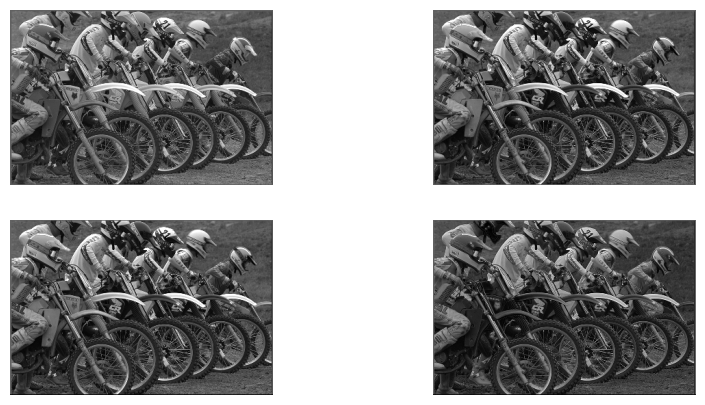

In [11]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.gray()
plt.subplot(2,2,1)
plt.imshow(dog[0,:,:,0])
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow(dog[0,:,:,1])
plt.axis('off')
plt.subplot(2,2,3)
plt.imshow(dog[0,:,:,2])
plt.axis('off')
plt.subplot(2,2,4)
plt.imshow(dog[0,:,:,3])
plt.axis('off')

*Figure 3.15: Separated Bayer color planes from the image of Fig. 3.14. Red is at upper left, blue is lower right, two green places are on the cross diagonal.*

## Creation of Training Blocks

In [12]:
trainS=480
testS=96
xtrain=np.zeros((trainS,64,64,4))
ytrain=np.zeros((trainS,128,128,3))
xtest=np.zeros((testS,64,64,4))
ytest=np.zeros((testS,128,128,3))
for imc in range(20):
  for row in range(4):
    for column in range(6):
      ytrain[(imc*24+row*6+column),:,:,:]=im[imc,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtrain[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[imc:(imc+1),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
for imc in range(4):
  for row in range(4):
    for column in range(6):
      ytest[(imc*24+row*6+column),:,:,:]=im[imc+20,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtest[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[(imc+20):(imc+21),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
xtrain=np.reshape(xtrain, (len(xtrain), 64, 64, 4))
ytrain=np.reshape(ytrain, (len(ytrain), 128, 128, 3))
xtest=np.reshape(xtest, (len(xtest), 64, 64, 4))
ytest=np.reshape(ytest, (len(ytest), 128, 128, 3))
train_dataset = tf.data.Dataset.from_tensor_slices((xtrain, ytrain))
test_dataset = tf.data.Dataset.from_tensor_slices((xtest,ytest))
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

1/1 [==============================] - 0s 42ms/step


Autoencoder with residuals

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 4)]      0         []                            
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 16)       272       ['input_2[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, None, None, 16)       0         ['conv2d_1[0][0]']            
 D)                                                                                               
                                                                                                  
 conv2d_2 (Conv2D)           (None, None, None, 16)       2320      ['max_pooling2d[0][0]'] 

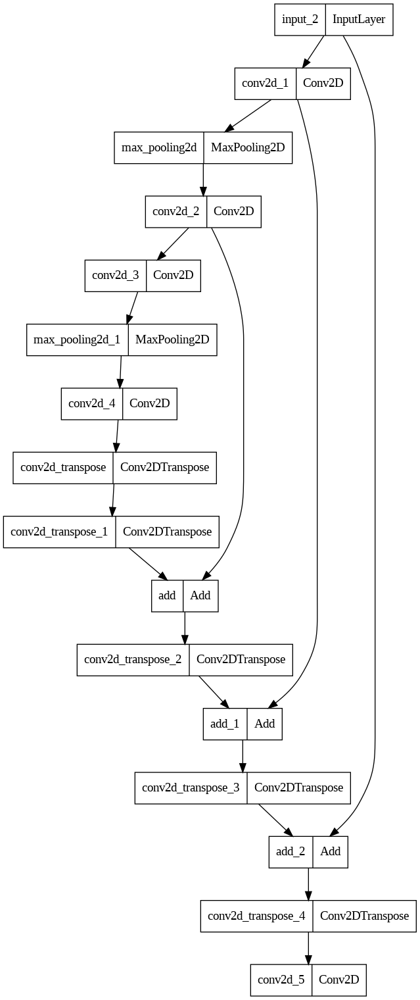

In [13]:
inputs = layers.Input(shape=(None,None,4))
# Encoder
x1 = layers.Conv2D(16, (2, 2), strides=2, activation="gelu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2))(x1)
x2 = layers.Conv2D(16, (3, 3), activation="gelu", padding="same")(x)
x3 = layers.Conv2D(16, (3, 3), strides=2, activation="relu", padding="same")(x2)
x = layers.MaxPooling2D((2, 2))(x3)
x = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x)
# Decoder
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)

x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x2])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x1])
x = layers.Conv2DTranspose(4, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,inputs])
x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
demosaic = Model(inputs, x)
demosaic.compile(optimizer="adam", loss="mean_squared_error")
demosaic.summary()

keras.utils.plot_model(demosaic)

## Train the model

In [14]:
demosaic.fit(train_dataset,
    epochs=1000,
    batch_size=32,
    shuffle=True,
    validation_data=test_dataset
)

Epoch 1/1000
15/15 [==============================] - 14s 379ms/step - loss: 0.1749 - val_loss: 0.1570
Epoch 2/1000
15/15 [==============================] - 6s 385ms/step - loss: 0.1559 - val_loss: 0.1408
Epoch 3/1000
15/15 [==============================] - 5s 331ms/step - loss: 0.1383 - val_loss: 0.1242
Epoch 4/1000
15/15 [==============================] - 7s 477ms/step - loss: 0.1191 - val_loss: 0.1073
Epoch 5/1000
15/15 [==============================] - 7s 443ms/step - loss: 0.1006 - val_loss: 0.0853
Epoch 6/1000
15/15 [==============================] - 5s 363ms/step - loss: 0.0718 - val_loss: 0.0583
Epoch 7/1000
15/15 [==============================] - 6s 401ms/step - loss: 0.0529 - val_loss: 0.0456
Epoch 8/1000
15/15 [==============================] - 7s 442ms/step - loss: 0.0414 - val_loss: 0.0379
Epoch 9/1000
15/15 [==============================] - 5s 323ms/step - loss: 0.0345 - val_loss: 0.0287
Epoch 10/1000
15/15 [==============================] - 7s 459ms/step - loss: 0.02

In [15]:
demosaic.save("demosaic")
!tar -czvf demosaic.tar.gz demosaic/
files.download('demosaic.tar.gz')

demosaic/
demosaic/keras_metadata.pb
demosaic/variables/
demosaic/variables/variables.index
demosaic/variables/variables.data-00000-of-00001
demosaic/fingerprint.pb
demosaic/assets/
demosaic/saved_model.pb


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [16]:
dog=demosaic.predict(cfaSample.predict(im[21:22,:,:,:]))

1/1 [==============================] - 0s 314ms/step


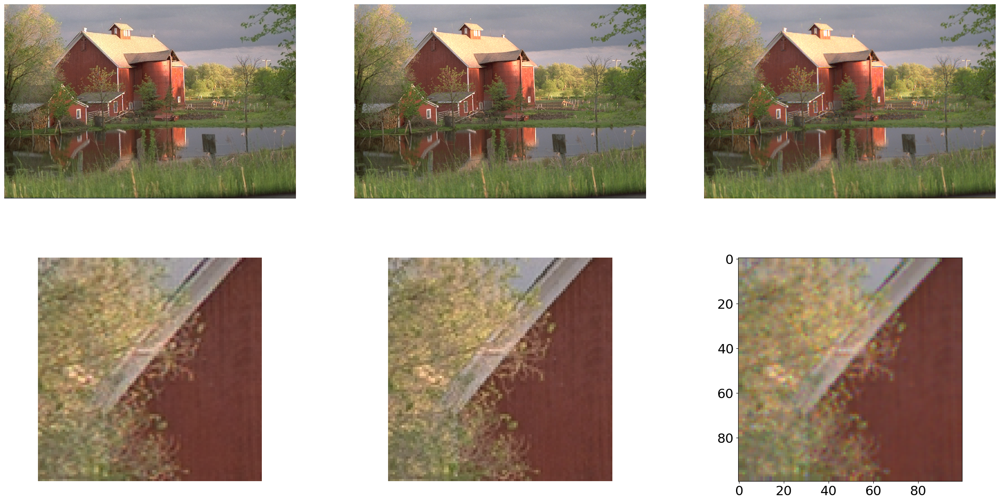

In [17]:
plt.figure(figsize=(30,15))
plt.subplot(2,3,1)
plt.imshow(dog[0,:,:,:])
plt.axis('off')
plt.subplot(2,3,2)
plt.imshow(im[21,:,:,:])
plt.axis('off')
plt.subplot(2,3,3)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[21,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,3,4)
plt.imshow(dog[0,100:200,100:200,:])
plt.axis('off')
plt.subplot(2,3,5)
plt.imshow(im[21,100:200,100:200,:])
plt.axis('off')
plt.subplot(2,3,6)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[21,100:200,100:200,:]), cv2.COLOR_BayerGR2BGR))

## Load trained model


In [18]:
!wget --no-check-certificate --content-disposition 'https://github.com/yiyunwu2001/OPTI556_Resources/blob/main/demosaic.tar.gz'
!tar -xvf demosaic.tar.gz

--2023-09-20 05:48:22--  https://github.com/yiyunwu2001/OPTI556_Resources/blob/main/demosaic.tar.gz
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4161 (4.1K) [text/plain]
Saving to: ‘demosaic.tar.gz.1’

demosaic.tar.gz.1   100%[===================>]   4.06K  --.-KB/s    in 0s      

2023-09-20 05:48:22 (27.3 MB/s) - ‘demosaic.tar.gz.1’ saved [4161/4161]

demosaic/
demosaic/keras_metadata.pb
demosaic/variables/
demosaic/variables/variables.index
demosaic/variables/variables.data-00000-of-00001
demosaic/fingerprint.pb
demosaic/assets/
demosaic/saved_model.pb


In [19]:
demosaic = keras.models.load_model('demosaic')

1/1 [==============================] - 1s 696ms/step


(-0.5, 767.5, 511.5, -0.5)

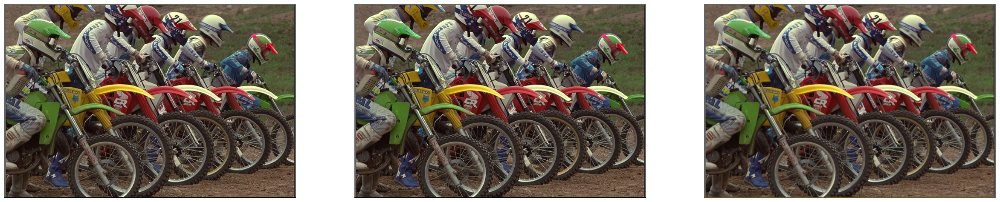

In [20]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(demosaic.predict(cfaSample.predict(im[4:5,:,:,:]))[0,:,:,:])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(im[4,:,:,:])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[4,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')

*Figure 3.16: Detail of the neural demosaicing system on the left, ground truth image in the center and the openCV Bayer to RGB bilinear interpolator on the right. The slight color pattern seen over the linear interpolation is due to zipper effects in linear demosaicing.*